In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

### Random Samples

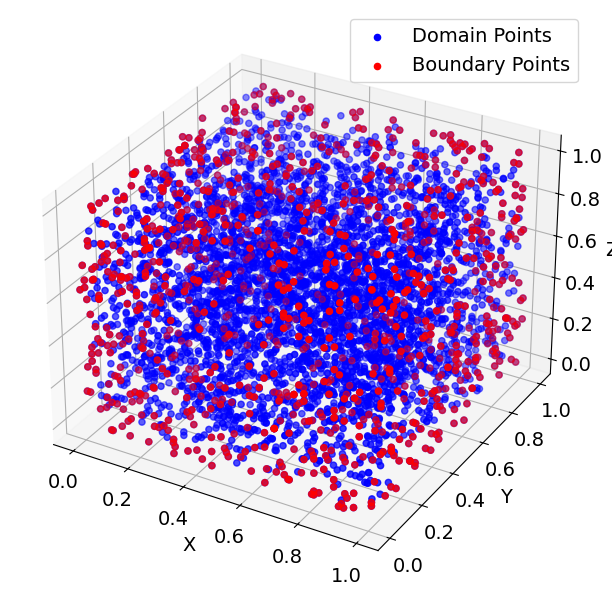

In [3]:
plt.rcParams.update({'font.size': 14})  # Adjust the font size globally

# Define the directory and file name
save_directory = '/rds/general/user/us322/ephemeral/3D Layered Training Filtered'
file_path = f'{save_directory}/filtered_0.1_0.055_0.1_60.npz'

# Load the .npz file
data = np.load(file_path)

# Access the combined data
combined_data = data['data']

# Unpack the combined data
x_train = combined_data[:, 0]
y_train = combined_data[:, 1]
z_train = combined_data[:, 2]

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7.5))
ax = fig.add_subplot(111, projection='3d')

# Plot all points in blue
ax.scatter(x_train, y_train, z_train, color='blue', marker='o', label='Domain Points')

# Manually select boundary points based on conditions
boundary_conditions_idx = np.where(
    (x_train == 0) | (x_train == 1) | (y_train == 0) | (y_train == 1) |
    (z_train == 0) | (z_train == 1/3) | (z_train == 2/3) | (z_train == 1)
)[0]

# Plot boundary points in red
ax.scatter(x_train[boundary_conditions_idx], y_train[boundary_conditions_idx], z_train[boundary_conditions_idx],
           color='red', label='Boundary Points')

# Labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Show the plot
plt.legend()
plt.savefig("./plots/randomsamplepoints.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

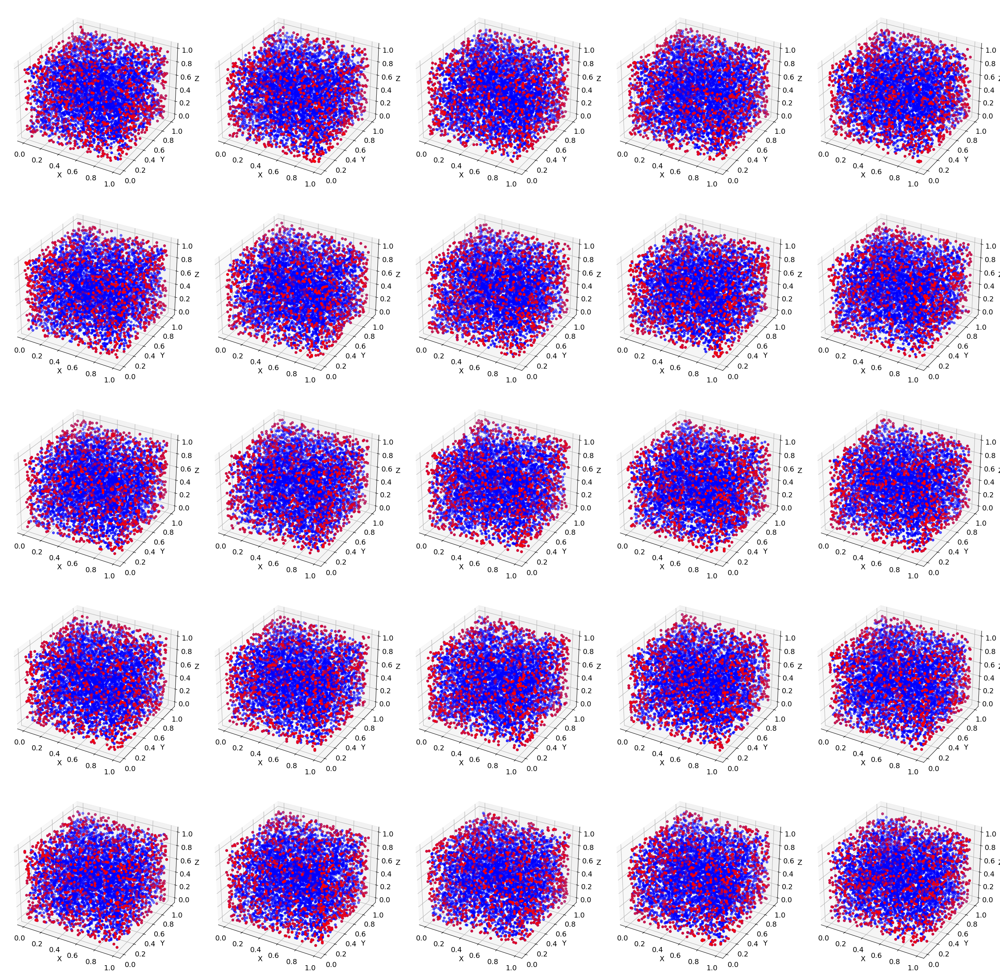

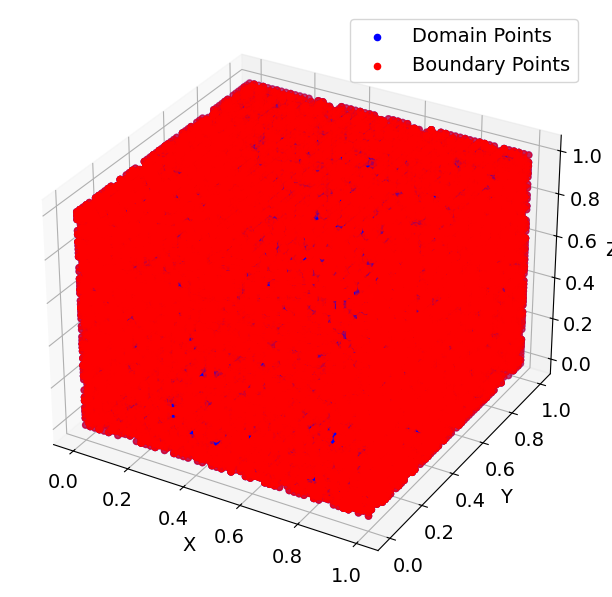

In [17]:
import itertools

plt.rcParams.update({'font.size': 14})  # Adjust the font size globally

# Define the directory and parameter values
save_directory = '/rds/general/user/us322/ephemeral/3D Layered Training Filtered'
cv_values = [0.01, 0.055, 0.10]
all_data = []

# Create figure for grid plots (5x5)
fig, axes = plt.subplots(5, 5, figsize=(35,35), subplot_kw={'projection': '3d'})
fig.subplots_adjust(hspace=0., wspace=0.1)

# Iterate over the first 25 combinations
for idx, (cv1, cv2, cv3) in enumerate(itertools.product(cv_values, repeat=3)):
    if idx >= 25:
        break
    file_path = f'{save_directory}/filtered_{cv1}_{cv2}_{cv3}_60.npz'
    
    # Load and extract data
    data = np.load(file_path)
    combined_data = data['data']
    x_train, y_train, z_train = combined_data[:, 0], combined_data[:, 1], combined_data[:, 2]
    
    all_data.append(combined_data)  # Store for the combined plot
    
    # Determine subplot location
    ax = axes[idx // 5, idx % 5]
    ax.scatter(x_train, y_train, z_train, color='blue', marker='o', label='Domain Points')
    
    # Identify boundary points
    boundary_conditions_idx = np.where(
        (x_train == 0) | (x_train == 1) | (y_train == 0) | (y_train == 1) |
        (z_train == 0) | (z_train == 1/3) | (z_train == 2/3) | (z_train == 1)
    )[0]
    
    # Plot boundary points in red
    ax.scatter(x_train[boundary_conditions_idx], y_train[boundary_conditions_idx], z_train[boundary_conditions_idx],
               color='red', marker='o', label='Boundary Points')
    
    #ax.set_title(f'cv=({cv1}, {cv2}, {cv3})')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

# Save and show the grid plot
plt.savefig("./plots/grid_samplepoints.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

# Create a single 3D scatter plot for all data
fig = plt.figure(figsize=(10, 7.5))
ax = fig.add_subplot(111, projection='3d')

all_data = np.vstack(all_data)  # Combine all arrays
x_train, y_train, z_train = all_data[:, 0], all_data[:, 1], all_data[:, 2]
ax.scatter(x_train, y_train, z_train, color='blue', marker='o', label='Domain Points')

# Identify boundary points
boundary_conditions_idx = np.where(
    (x_train == 0) | (x_train == 1) | (y_train == 0) | (y_train == 1) |
    (z_train == 0) | (z_train == 1/3) | (z_train == 2/3) | (z_train == 1)
)[0]

# Plot boundary points in red
ax.scatter(x_train[boundary_conditions_idx], y_train[boundary_conditions_idx], z_train[boundary_conditions_idx],
           color='red', marker='o', label='Boundary Points')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.legend()
plt.savefig("./plots/combined_samplepoints.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

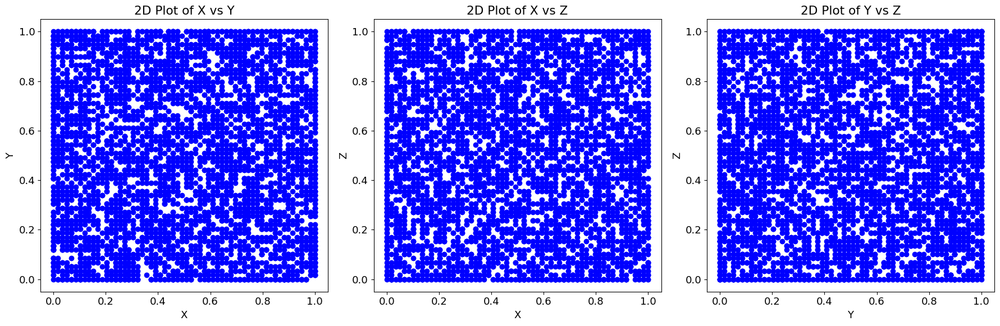

In [28]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot (x, y)
axs[0].scatter(x_train, y_train, color='blue', marker='o')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].set_title('2D Plot of X vs Y')

# Plot (x, z)
axs[1].scatter(x_train, z_train, color='blue', marker='o')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Z')
axs[1].set_title('2D Plot of X vs Z')

# Plot (y, z)
axs[2].scatter(y_train, z_train, color='blue', marker='o')
axs[2].set_xlabel('Y')
axs[2].set_ylabel('Z')
axs[2].set_title('2D Plot of Y vs Z')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

### Testing/Training Region 

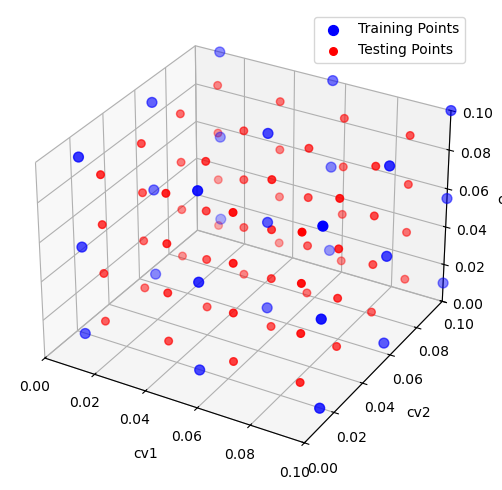

In [11]:
plt.rcParams.update({'font.size': 10})  # Adjust the font size globally

# Define the values for cv1, cv2, and cv3 for both sets
cv_values_27 = [0.01, 0.055, 0.10]
cv_values_64 = [0.015, 0.04, 0.065, 0.09]

# Generate the 27 combinations
cv1_27, cv2_27, cv3_27 = np.meshgrid(cv_values_27, cv_values_27, cv_values_27)
cv1_27, cv2_27, cv3_27 = cv1_27.flatten(), cv2_27.flatten(), cv3_27.flatten()

# Generate the 64 combinations
cv1_64, cv2_64, cv3_64 = np.meshgrid(cv_values_64, cv_values_64, cv_values_64)
cv1_64, cv2_64, cv3_64 = cv1_64.flatten(), cv2_64.flatten(), cv3_64.flatten()

# Create a 3D plot
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111, projection='3d')

# Plot the 27 combinations in blue
ax.scatter(cv1_27, cv2_27, cv3_27, c='blue', s=50, label='Training Points')

# Plot the 64 combinations in red
ax.scatter(cv1_64, cv2_64, cv3_64, c='red', s=30, label='Testing Points')

# Set labels and title
ax.set_xlabel('cv1',labelpad=7)
ax.set_ylabel('cv2',labelpad=7)
ax.set_zlabel('cv3',labelpad=7)
ax.legend()

# Set axis limits
ax.set_xlim(0.0, 0.10)
ax.set_ylim(0.0, 0.10)
ax.set_zlim(0.0, 0.10)

# Set the perspective (elevation and azimuthal angle)
#ax.view_init(elev=30, azim=10)

# Show the plot
plt.savefig('./plots/samplepoints.png',dpi=600, bbox_inches='tight', pad_inches=0.28)
plt.show()

### Transfer Learning

#### Layered Loss:

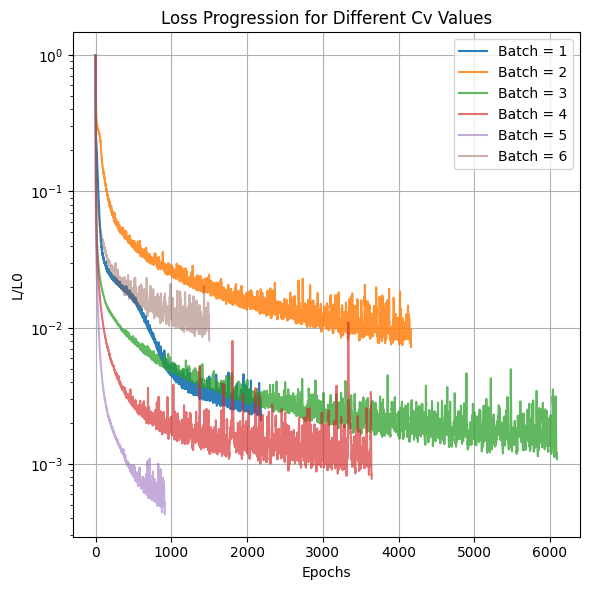

In [4]:
fig, ax = plt.subplots(figsize=(6, 6))

alpha_base = 0.95

# Loop through cv values, load the data, and plot
for i, batch in enumerate(np.arange(1,7)):
    # Construct the file path
    file_path = f'/rds/general/user/us322/home/3DTLNew/TL_loss/layered_TL_{batch}.npy'
    
    # Load the loss data
    loss = np.load(file_path)
    
    # Plot the loss with increasing transparency
    ax.semilogy(
        np.arange(len(loss)), 
        loss / loss[0], 
        label=f'Batch = {batch}', 
        alpha=alpha_base - i * 0.1
    )

# Customize the plot
ax.set_xlabel("Epochs")
ax.set_ylabel("L/L0")
ax.set_title("Loss Progression for Different Cv Values")
ax.legend()
ax.grid(True)

# Save and display the plot
plt.tight_layout()
plt.savefig('SimpleLossComparison.png', dpi=600)
plt.show()

#### Simple Loss:

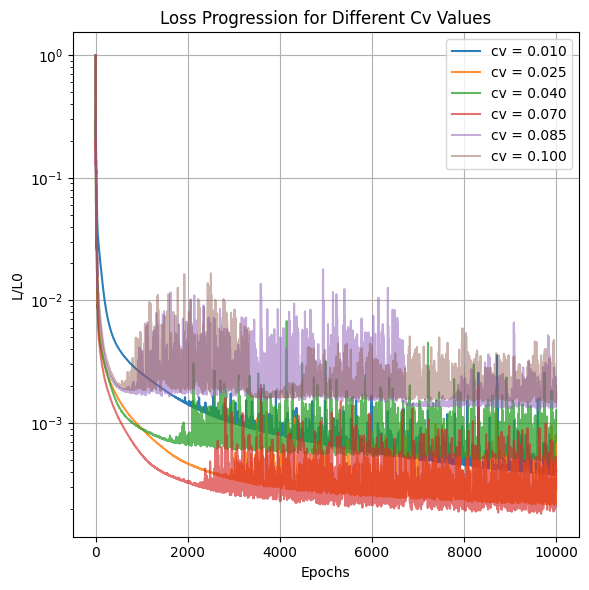

In [8]:
# List of cv values
cv_values = [0.01, 0.025, 0.04, 0.07, 0.085, 0.1]

fig, ax = plt.subplots(figsize=(6, 6))

alpha_base = 0.95

# Loop through cv values, load the data, and plot
for i, cv in enumerate(cv_values):
    # Construct the file path
    file_path = f'./loss/simple/simpleloss_{cv}.npy'
    
    # Load the loss data
    loss = np.load(file_path)
    
    # Plot the loss with increasing transparency
    ax.semilogy(
        np.arange(len(loss)), 
        loss / loss[0], 
        label=f'cv = {cv:.3f}', 
        alpha=alpha_base - i * 0.1
    )

# Customize the plot
ax.set_xlabel("Epochs")
ax.set_ylabel("L/L0")
ax.set_title("Loss Progression for Different Cv Values")
ax.legend()
ax.grid(True)

# Save and display the plot
plt.tight_layout()
plt.savefig('SimpleLossComparison.png', dpi=600)
plt.show()

### Final Layered Loss Function

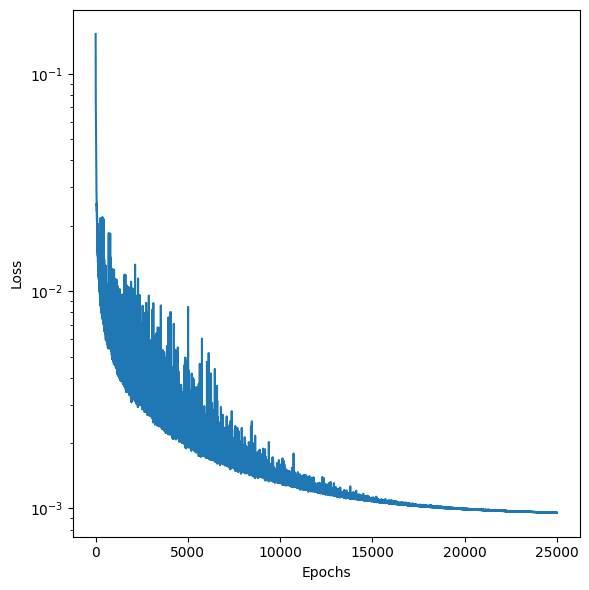

In [7]:
loss = np.load('/rds/general/user/us322/home/3DTLNew/loss/layeredloss_final_25000_12500.npy')

def cust_semilogx(AX, X, Y, xlabel, ylabel, title):
    if X is None:
        im = AX.semilogy(Y)
    else:
        im = AX.semilogy(X, Y)
    if xlabel is not None: AX.set_xlabel(xlabel)
    if ylabel is not None: AX.set_ylabel(ylabel)
    #if title is not None: AX.set_title(title)

fig, ax = plt.subplots(figsize=(6, 6))

cust_semilogx(ax, None, np.array(loss), "Epochs", "Loss", "Loss Function")

fig.subplots_adjust(left=0.1, right=0.9, bottom=0.15, top=0.9, wspace=0.3, hspace=0.2)
plt.savefig('./plots/LossFunction.png',dpi=600, bbox_inches='tight')
plt.tight_layout()
plt.show()